# Nvidia & AMD - Analysis on Risk & Return
_Which stock is more valuable to invest into?_

## Context
Our friend saved up a significant amount of money during her freelancing efforts and wants to make an investment in the stock market. She wants to **invest 20.000€** and continue to invest **500€ each month** down the line. She is convinced that the graphics chip market will continue to grow and sets her bet on the NVIDIA (_NVDA_) or AMD (_AMD_) stock. As both companies are in competition, she assumes the stocks will run against each other and cancel their return out. So, to secure a positive return, she wants to invest to only the more promising one of them.

Another factor for our friend is that the potential total loss of her investment should not be over 20%. If the targeted assets are as volatile to bring a higher fluctuation than that, she would like to look for an alternative strategy instead. 

## Goal
Between the stocks of the two chip manufacturers AMD (_AMD_) and NVIDIA (_NVDA_), which one serves as a more risk-free investment if the total tolerance of loss is at 20% of the investment value?

## Data
Available are time-series on the historical data of AMD (_AMD_), NVIDIA (_NVDA_) as well as Intel Corporation (_INTC_) as a potential comparison. All datasets are stored as a CSV, with a covering timespan from Apr. 13 2016 - Apr. 12 2021 (5 years).

## Analysis
### Setup


In [378]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as md
import numpy as np
from scipy import stats

amd = pd.read_csv("./datasets/AMD.csv")
nvidia = pd.read_csv("./datasets/NVDA.csv")
intel = pd.read_csv("./datasets/INTC.csv")

combined = amd.assign(Stock="AMD").append(nvidia.assign(Stock="NVIDIA")).append(intel.assign(Stock="Intel")).set_index(["Stock", "Date"]).sort_index(axis=0, level=1, ascending=False)
combined = combined.sort_index(level=1, ascending=True)

## Descriptive review of Data
The structure of our dataframes looks as following.

In [379]:
print(combined.head())

                        Open       High        Low      Close  Adj Close  \
Stock  Date                                                                
AMD    2016-04-13   2.780000   2.820000   2.730000   2.800000   2.800000   
Intel  2016-04-13  31.969999  32.180000  31.950001  32.130001  28.164856   
NVIDIA 2016-04-13  36.000000  36.750000  36.000000  36.740002  36.079113   
AMD    2016-04-14   2.770000   2.790000   2.700000   2.720000   2.720000   
Intel  2016-04-14  31.780001  31.889999  31.549999  31.799999  27.875582   

                     Volume  
Stock  Date                  
AMD    2016-04-13   8048000  
Intel  2016-04-13  19968100  
NVIDIA 2016-04-13   8767900  
AMD    2016-04-14   8985300  
Intel  2016-04-14  21620900  


Each row documents a trading-day of the stock in each year. 
* The `Date` column holds the date of the trading-day. 
* `High` and `Low` describe the highest/lowest stock value in the timeframe of the day. 
* `Open` indicates the stock value in the beginning of the day (market open), while `Close` holds the terminating value at the end of the day (market close). 

Adjustments can be made to the price on close due to [various factors](https://www.investopedia.com/terms/a/adjusted_closing_price.asp) as a stock split. It is therefore common to provide a an *adjusted closing price* for historical stock data analysis. We will not go into the details of the factors for this value, but proceed with the assumption that the *adjusted closing price* is the most precise value to work with for a long-term analysis as we aim for. The *adjusted closing price* is stored in the `Adj Close` column.

The `Volume` counts the number of shares traded during `Open` and `Close`. For the 2016-04-07 as an example, 44.281.000 shares have been traded over the course of the trading day.

## Visualizing our Data

In [380]:
combined["Datetime"] = pd.to_datetime(combined.index.get_level_values("Date"))
amd["Datetime"] = pd.to_datetime(amd["Date"])
nvidia["Datetime"] = pd.to_datetime(nvidia["Date"])

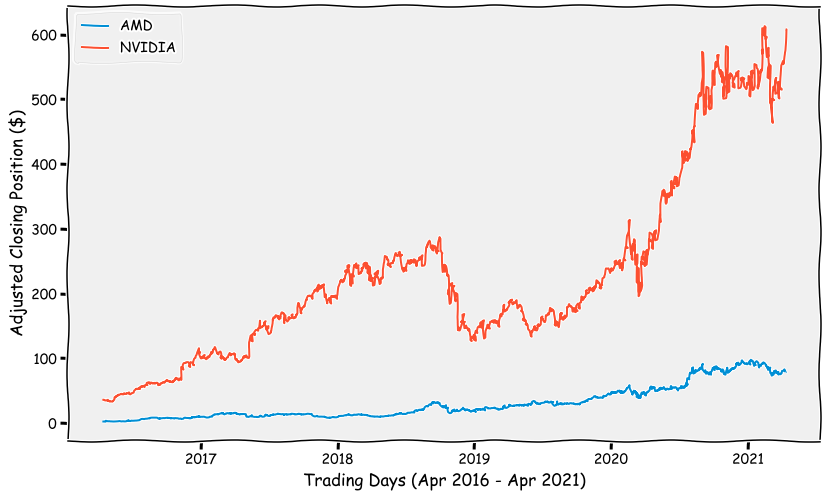

In [381]:
fig, ax = plt.subplots(figsize=(12, 8))
sns.lineplot(ax=ax, x = "Datetime", y = "Adj Close", data=combined.loc[["AMD","NVIDIA"]],  hue="Stock").set(xlabel="Trading Days (Apr 2016 - Apr 2021)",ylabel="Adjusted Closing Position ($)");

ax.xaxis.set_major_formatter(md.DateFormatter("%Y"))
plt.legend(loc="upper left")

plt.show()

## Simple Risk-Reward-Ratio: The Sharpe Ratio
The easist method for a first glance on assessing the desirability of one asset to another in terms of risk and reward is the Sharpe Ratio. It was developed in 1966 to compare the expected return of two assets in relation to the implied risk. It is still used today in portfolio risk analysis and significantly contributed to William Sharpe's win of the Nobel Prize in Economics.

The Sharpe Ratio of two assets is best determined in comparison to a shared benchmark. The S&P500 is a popular index that covers the top 500 US equities. Both AMD and NVDA are featured on the S&P 500 and have been a strong contributor in the recent years. The S&P 500 is therefore a well fitting benchmark for a Sharpe Ratio calculation.

#### Setup S&P 500 Index Data
The data provider for the S&P 500 Index is nasdaq.com. The dataset features the same points on `Open`, `Close`, `High` and `Low` values. A `Volume` on the index dataset is not available.
The dataframe will be initiated with the `Date` column as its index.

The dataset is naturally sorted descending by the `Date`. The dataset is reverted to have an order from past to present.

In [362]:
sp500 = pd.read_csv("./datasets/S&P500.csv")

# convert Date column to datetime standard
sp500["Date"] = pd.to_datetime(sp500["Date"])
sp500 = sp500.set_index("Date")

# review dataframe structure
sp500.head()


,Close,Volume,Open,High,Low
Date,,,,,
2021-04-12,4127.99,--,4124.71,4131.76,4114.82
2021-04-09,4128.80,--,4096.11,4129.48,4095.51
2021-04-08,4097.17,--,4089.95,4098.19,4082.54
2021-04-07,4079.95,--,4074.29,4083.13,4068.31
2021-04-06,4073.94,--,4075.57,4086.23,4068.14


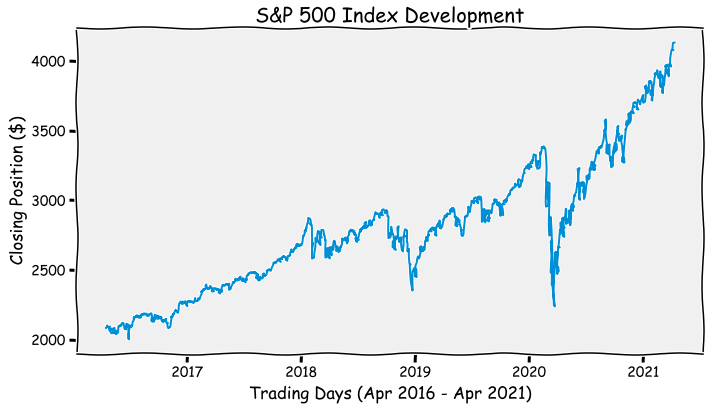

In [363]:
sp500["Datetime"] = pd.to_datetime(sp500.index.get_level_values("Date"))

fig, ax = plt.subplots(figsize=(10, 6))
sns.lineplot(ax=ax, x = "Datetime", y = "Close", data=sp500).set(xlabel="Trading Days (Apr 2016 - Apr 2021)",ylabel="Closing Position ($)");

ax.xaxis.set_major_formatter(md.DateFormatter("%Y"))
plt.title("S&P 500 Index Development")

plt.show()

#### Percental Daily Discrete Returns
To compare the value development of one asset to another ones value developments, the change of value from day to day has to be relativized. The simplest approach is the comparison of Close-to-Close relation.

In [364]:
sp500["Discrete Return"] = sp500["Close"].pct_change()

combined.loc[["AMD"], "Discrete Return"] = combined.loc[["AMD"], "Adj Close"].pct_change()
combined.loc[["NVIDIA"], "Discrete Return"] = combined.loc[["NVIDIA"], "Adj Close"].pct_change()

print("S&P 500 Daily Change");
print(sp500["Discrete Return"].tail())
print("\n")
print("AMD & NVIDIA Daily Change (respective to same stock)");
print(combined.loc[["AMD", "NVIDIA"], "Discrete Return"].tail());

S&P 500 Daily Change
Date
2016-04-19   -0.000761
2016-04-18   -0.003075
2016-04-15   -0.006498
2016-04-14    0.000985
2016-04-13   -0.000173
Name: Discrete Return, dtype: float64


AMD & NVIDIA Daily Change (respective to same stock)
Stock   Date      
NVIDIA  2021-04-06   -0.009008
        2021-04-07    0.020344
        2021-04-08    0.012267
        2021-04-09    0.005797
        2021-04-12    0.056181
Name: Discrete Return, dtype: float64


#### Excess Return AMD/NVIDIA to S&P 500 Index
The percental excess return for AMD/NVIDIA in relation to the S&P 500 index is the difference of percental discrete return of stock to index:

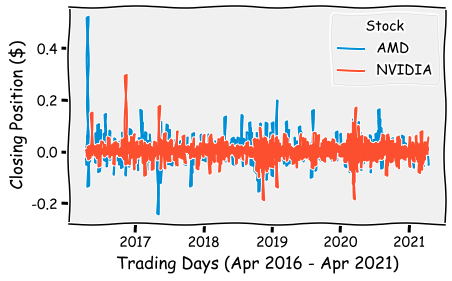

         count      mean       std       min       25%       50%       75%  \
Stock                                                                        
AMD     1257.0  0.003424  0.039909 -0.242291 -0.016032  0.001899  0.020718   
NVIDIA  1257.0  0.002704  0.030248 -0.187559 -0.010791  0.002897  0.017246   

             max  
Stock             
AMD     0.522901  
NVIDIA  0.298067  


In [365]:
combined.loc[["AMD"], "Excess Return"] = combined.loc[["AMD"], "Discrete Return"].sub(sp500["Discrete Return"], axis=0, level=0, fill_value=0)
combined.loc[["NVIDIA"], "Excess Return"] = combined.loc[["NVIDIA"], "Discrete Return"].sub(sp500["Discrete Return"], axis=0, level=0, fill_value=0)

sns.lineplot(x = "Datetime", y = "Excess Return", data=combined.loc[["AMD", "NVIDIA"]], hue="Stock").set(xlabel="Trading Days (Apr 2016 - Apr 2021)",ylabel="Closing Position ($)");
plt.show();

print(combined.loc[["AMD", "NVIDIA"], "Excess Return"].groupby("Stock").describe())

### The Sharpe Ratio of AMD/NVIDIA
The Sharpe Ratio is essentially a standardized mean return in relation to the volatility (generally: the standard deviation).
It is defined as following:

### $S(x) = {{({\mu}_{x} - {R}_{f})} \over { {\sigma}_{{r}_{x}} } }$
​
where:
* $S(x)$ is the Sharpe Ratio of $x$
* $x$ is the investment
* ${\mu}_{x}$ is the mean return of $x$
* ${R}_{f}$ is the risk-free return
* ${\sigma}_{{r}_{x}}$ is the standard deviation of the mean of $x$.

The risk-free return ${R}_{f}$ can be neglected in the following context due to multiple reasons. First, the effective interest rate (direct risk-free-ratio factor) on common derivatives for the risk-free ratio (3-month U.S. Treasury Bill, EUR Risk-Free Rate) has rarely been lower than in the recent years compared to the historical development of risk-free returns. Today's risk-free interest rate for the EUR is between 1% to -1% and is therefore mathematically insignifcant for our Sharpe ratio (https://www.venn.twosigma.com/vennsights/the-role-of-the-risk-free-rate). Second, a singular equity investment (e.g. single stock investment as AMD/NVIDIA) does not yield a risk-free rate in practice. (https://www.investopedia.com/terms/r/risk-freerate.asp) A portfolio of equity investments may allow a risk-free return in relation to the mean growth of it's most related index. As we analyse single equity investments here, a risk-free return should not be assumed.

#### Calculation of Sharpe ratio

In [366]:
amd_mean_excess_return = combined.loc[["AMD"], "Excess Return"].mean()
amd_excess_return_std = combined.loc[["AMD"], "Excess Return"].std()
amd_sharpe_ratio = amd_mean_excess_return / amd_excess_return_std


nvidia_mean_excess_return = combined.loc[["NVIDIA"], "Excess Return"].mean()
nvidia_excess_return_std = combined.loc[["NVIDIA"], "Excess Return"].std()
nvidia_sharpe_ratio = nvidia_mean_excess_return / nvidia_excess_return_std

annualized_amd_sharpe_ratio = amd_sharpe_ratio * np.sqrt(annual_trading_days)
annualized_nvidia_sharpe_ratio = nvidia_sharpe_ratio * np.sqrt(annual_trading_days)

print("AMD's Sharpe-Ratio equals:",annualized_amd_sharpe_ratio)
print("NVIDIA's Sharpe-Ratio equals:", annualized_nvidia_sharpe_ratio)

AMD's Sharpe-Ratio equals: 1.3617769698280615
NVIDIA's Sharpe-Ratio equals: 1.4192150667327752


A higher Sharpe Ratio implies a higher return relative to the volatility. A Sharpe Ratio of 1 and up is an indication of a return proportional to the risk (to the volatility). Therefore, the stock with the highest Sharpe Ratio should be considered as most desirable. In our case, *NVIDIA* wins the bet for best return-per-risk!

### __Conclusion $I$: NVIDIA shows a higher return-per-risk by Sharpe Ratio.__

## Determining Distribution Normality

### Visualizing Returns
The stocks in their raw visualization are incomparable, as they have a large difference of value range: AMD's recent value is located between 70-100 US Dollar, while TSLA is located between 500-600 US Dollar.

We therefore determine the daily percental change of the stock adjusted closing value between trading days to better assess and compare the initial impression of volatility, i.e. the change in percental value by day. This lays out the _discrete daily returns_ of our asset. 

In [367]:
amd["Discrete Returns"] = amd["Adj Close"].pct_change()
nvidia["Discrete Returns"] = nvidia["Adj Close"].pct_change()

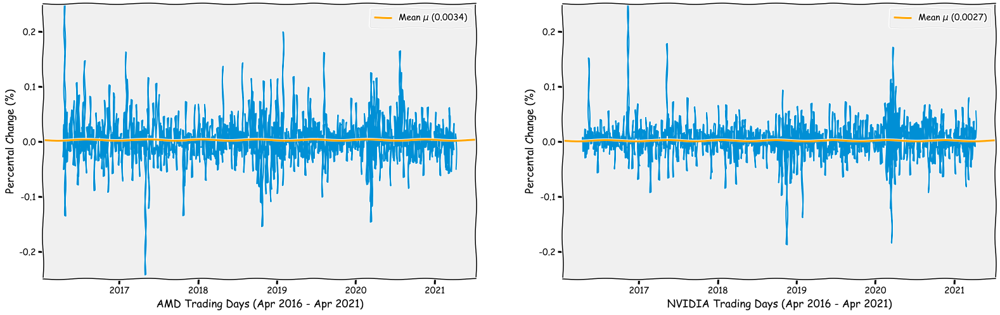

In [368]:
fig, ax = plt.subplots(1, 2, figsize=(24,8))
sns.lineplot(x = "Datetime", y = "Discrete Returns", data=amd, ax=ax[0])
sns.lineplot(x = "Datetime", y = "Discrete Returns", data=nvidia, ax=ax[1])

# describe axes
ax[0].set(xlabel="AMD Trading Days (Apr 2016 - Apr 2021)", ylabel="Percental Change (%)")
ax[1].set(xlabel="NVIDIA Trading Days (Apr 2016 - Apr 2021)", ylabel="Percental Change (%)")

# define same y-limits (max-range: 50% change in one day -> statistically very unlikely to exceed)
ax[0].set_ylim(-0.25,0.25)
ax[1].set_ylim(-0.25,0.25)

# display mean as horizontal line
ax[0].axhline(y=amd["Discrete Returns"].mean(), linewidth=3.0, color="orange", label="Mean $\mu$ (" + str(amd["Discrete Returns"].mean().round(4)) + ")")
ax[1].axhline(y=nvidia["Discrete Returns"].mean(), linewidth=3.0, color="orange", label="Mean $\mu$ (" + str(nvidia["Discrete Returns"].mean().round(4)) + ")")

# add x-axis description
ax[0].xaxis.set_major_formatter(md.DateFormatter("%Y"))
ax[1].xaxis.set_major_formatter(md.DateFormatter("%Y"))

# add legend
ax[0].legend(loc="upper right")
ax[1].legend(loc="upper right")

plt.show()

Despite it's seemingly steady line in the previous lineplot, we derive a significantly more equal volatility for the AMD stock to the NVIDIA stock. This is relevant for our determination of risk as a high spread of value over time for a stock can be a leading factor to rapid loss (but also: rapid gain).

The outliers of daily percental change of AMD appear to be extremer (higher deviation from the mean value). To resolve or reject this impression, a visualization and statistical analyization of the distribution of both daily percental changes comes to mind.

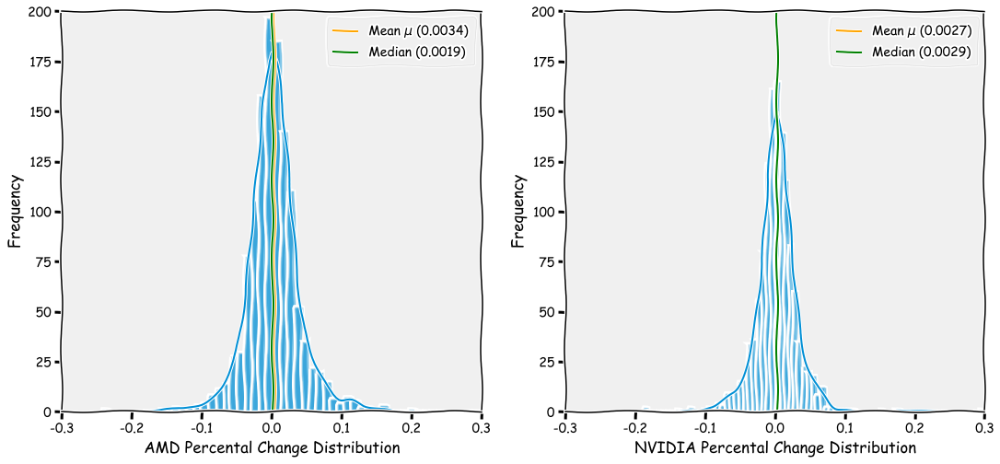

In [369]:
fig, ax = plt.subplots(1, 2, figsize=(16, 8))

sns.histplot(x=amd["Discrete Returns"], bins=75, ax=ax[0], kde=True)
sns.histplot(x=nvidia["Discrete Returns"], bins=75, ax=ax[1], kde=True)

# describe axes
ax[0].set(xlabel="AMD Percental Change Distribution", ylabel="Frequency")
ax[1].set(xlabel="NVIDIA Percental Change Distribution", ylabel="Frequency")

# set mean vertical line
ax[0].axvline(x=amd["Discrete Returns"].mean(), color="orange", label="Mean $\mu$ (" + str(amd["Discrete Returns"].mean().round(4)) + ")")
ax[1].axvline(x=nvidia["Discrete Returns"].mean(), color="orange", label="Mean $\mu$ (" + str(nvidia["Discrete Returns"].mean().round(4)) + ")")

# set median vertical line
ax[0].axvline(x=amd["Discrete Returns"].median(), color="green", label="Median (" + str(amd["Discrete Returns"].median().round(4)) + ")")
ax[1].axvline(x=nvidia["Discrete Returns"].median(), color="green", label="Median (" + str(nvidia["Discrete Returns"].median().round(4)) + ")")

ax[0].set_xlim([-0.3,0.3])
ax[1].set_xlim([-0.3,0.3])

ax[0].set_ylim([0,200])
ax[1].set_ylim([0,200])


ax[0].legend(loc="upper right")
ax[1].legend(loc="upper right")

plt.show()

Assuming a normal distribution of the dailypercental change, the previously graphed volatility (see lineplot above) visualized as a histogram is neatly displayed here to be in relation to the standard deviation of the historical daily change. The standard deviation is therefore a commonly used factor of [Volatility determination](https://www.investopedia.com/terms/v/volatility.asp).

The percental change distributions of both stocks indicate a fairly normal distribution with a mean close to 0.0. 
What can we further derive from this visualization? There are promising first impressions to be made: First, both means are tilted towards the positive of the zero-center, indicating a small but general historical growth of the stock. Furthermore, NVIDI's distribution indicates an asymmetrical set of outliers at the extremes, displaying a small but significant longer tail into the positives. An investor can benefit from this. A sudden strong positive growth seems more probable than a sudden strong regression, statistically speaking.

For the assumption of a normal distribution, we should further consider the skewness and kurtosis of the distributions. As a rule of thumb, we can derive the nonparametric skew of the distribution by looking at the relation of mean to median. If the mean is right to the median, we can expect a positive skew. If the mean is left to the median, we can expect a negative skew. Based on this rule of thumb, AMD's return distribution indicate a positive skew, while NVIDIA indicates a slightly negative skew. A positive skew is desirable in finance, as a tendency to more positive return values translates to more return growth for the investment.

Let's take a look at the kurtosis mathematically and try to prove our assumptions on the skewness of the curves.

### Analysis for normality of return distribution (Skewness & Kurtosis)
The first impressions on the relation of median and mean of both our graphs left us with the following two assumptions on the skewness:
* The AMD return distribution is positively skewed.
* The NVIDIA return distribution is slightly negatively skewed.

The skewness of a curve can be determined mathematically with the `skew` method of `scipy.stats`.

In [370]:
amd_skew = stats.skew(amd["Discrete Returns"].dropna())
nvidia_skew = stats.skew(nvidia["Discrete Returns"].dropna())

print("The skewness for AMD's return distribution is:", np.round(amd_skew,3))
print("The skewness for NVIDIA's return distribution is:", np.round(nvidia_skew,3))

The skewness for AMD's return distribution is: 1.864
The skewness for NVIDIA's return distribution is: 0.486


Our assumption on the skewness of AMD's return distribution was correct - it is positively skewed. To a surprise, the NVIDIA return distribution is also positively skewed. We make this different mathemtical finding as our previous rule of thumb about the relation of medium to mean remains a _rule of thumb_ and is not always a precise measure. (http://jse.amstat.org/v13n2/vonhippel.html)

#### Kurtosis
Generally speaking, the kurtosis of our distribution indicates the probability for outliers. For the financial context, a higher kurtosis therefore indicates a higher risk for a deviation to extremer outliers (loss, gain).

In [371]:
amd_kurtosis = stats.kurtosis(amd["Discrete Returns"].dropna())
nvidia_kurtosis = stats.kurtosis(nvidia["Discrete Returns"].dropna())

print("The excess kurtosis for AMD's return distribution is:", np.round(amd_kurtosis,6))
print("The excess kurtosis for NVIDIA's return distribution is:", np.round(nvidia_kurtosis,6))

The excess kurtosis for AMD's return distribution is: 25.356667
The excess kurtosis for NVIDIA's return distribution is: 12.186643


The kurtosis of both graphs indicate a high probability for outliers. The distribution of our asset returns are therefore fat-tailed and highlights another indiactor for non-normality.

The suggested non-normality by skewness and high kurtosis can be tested with the Shapiro-Walk test.

#### Shapiro-Wilk test for normality on distribution

The Shapiro-Wilk test will preform a statistical test to determine the normality of a distribution.

For both our distributions, the null hypothesis will be:
* N0: The discrete return is normally distributed.

The null hypothesis will be testes for the 95% confidence interval.

In [372]:
amd_p_value = stats.shapiro(amd["Discrete Returns"].dropna()).pvalue
if amd_p_value <= 0.05:
    print("Null hypothesis rejected. The AMD return distribution is non-normal.")
else:
    print("Null hypothesis accepted. The AMD return distribution is normal.")

Null hypothesis rejected. The AMD return distribution is non-normal.


In [373]:
nvidia_p_value = stats.shapiro(nvidia["Discrete Returns"].dropna()).pvalue
if nvidia_p_value <= 0.05:
    print("Null hypothesis rejected. The NVIDIA return distribution is non-normal.")
else:
    print("Null hypothesis accepted. The NVIDIA return distribution is normal.")

Null hypothesis rejected. The NVIDIA return distribution is non-normal.


We were able to highlight that both stock's return distribution are non-normal.

## Determining Historical Volatility
Volatility is a leading factor for the determination of risk for an investment. It states the tendency for fluctuation of an asset's value and therefore the risk for potential rapid or strong loss.
There are various formulas developed over the centuries to predict historical and implied volatility. _Historical_ volatility determines the fluctuation of an asset's value based on historical, i.e past data. _Implied_ volatility tries to forecast volatility based on supply and demand in the future. Implied volatility is especially intersting for options trading.

We will try to compare the historical volatility of the AMD and NVIDIA stock with various volatility formulas.

Volatility of a stock is time-relevant. Using the entire historical data for a volatility determination is problematic as fluctuation tendencies can change by period in their intensity (heteroskedasticity). Volatility is commonly under the influence of time-based events that are political, social or economical. It is therefore utmost important to frame the respected data for volatility determination into a reasonable recent timeframe. A common frame are the recent 10 - 180 days, depending on the intention and type of asset traded.
For the following calculations, we use a time range of the last 30 trading days.

### Annualized Close-to-Close Historical Volatility (CCHV)
The Close-to-Close formula is the easiest formula for volatility determination. It compares the change of Closing values for each day in a given timeframe.

${calculation here}$


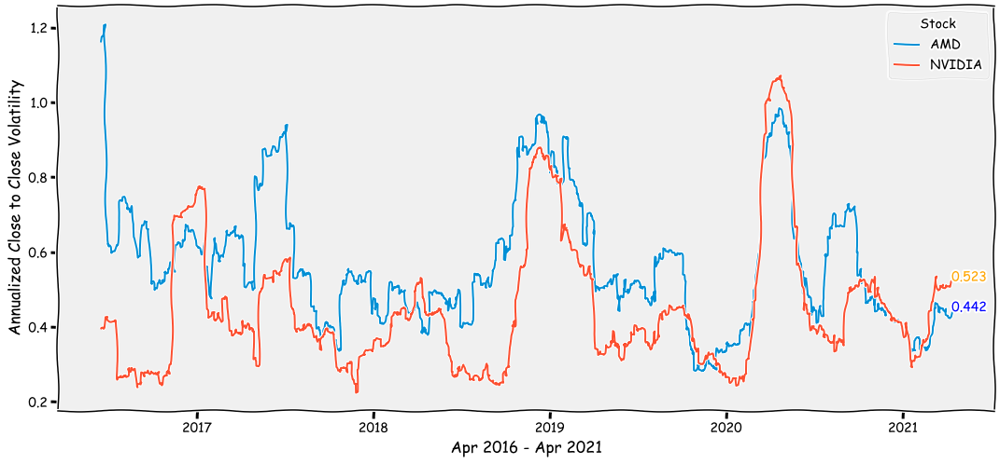

In [377]:
annual_trading_days = 252

T = 45 # trading days window

amd_log_returns = (combined.loc[["AMD"], "Adj Close"] / combined.loc[["AMD"], "Adj Close"].shift(1)).agg(np.log)
combined.loc[["AMD"], "CCHV"] = amd_log_returns.rolling(T).std() * np.sqrt(annual_trading_days)

nvidia_log_returns = (combined.loc[["NVIDIA"],"Adj Close"] / combined.loc[["NVIDIA"],"Adj Close"].shift(1)).agg(np.log)
combined.loc[["NVIDIA"], "CCHV"] = nvidia_log_returns.rolling(T).std() * np.sqrt(annual_trading_days)

fig, line = plt.subplots(figsize= (16, 8))
line = sns.lineplot(x= "Datetime", y="CCHV", hue="Stock", data=combined.loc[["AMD","NVIDIA"]])

# describe axes
line.set(xlabel="Apr 2016 - Apr 2021", ylabel="Annualized Close to Close Volatility")

# describe last data point
amd_last = combined.loc[["AMD"]].iloc[-1:]
nvidia_last = combined.loc[["NVIDIA"]].iloc[-1:]
line.text(x= amd_last["Datetime"], y=amd_last["CCHV"], s=np.round(amd_last["CCHV"][0],3), color="blue")
line.text(x= nvidia_last["Datetime"], y=nvidia_last["CCHV"], s=np.round(nvidia_last["CCHV"][0],3), color="orange")

plt.show()

In [375]:
Both assets show a relatively similar looking historical volatility development over the last years. This is to be expected from stable participants of one peer group (computer chip manufacturers). Events as short-comings on resources (e.g. silicon) or Apple cutting ways with AMD and NVIDIA to develop their own M1 chip affects both companies simultaneously.



SyntaxError: invalid syntax (<ipython-input-375-e4dfc04af9d7>, line 1)